In [1]:
from aicsimageio import AICSImage

# Cargar la imagen
filename = "gfap3.tif"
image = AICSImage(filename)

# Obtener shape y nombres de dimensiones
print("Shape de la imagen:", image.shape)  # Ejemplo: (T, C, Z, Y, X)
print("Nombres de dimensiones:", image.dims)  # Ejemplo: Dimensions [T: 1, C: 4, Z: 22, Y: 1024, X: 1024]

# Obtener tamaño de voxel y corregir manualmente el Z
voxel_size = image.physical_pixel_sizes  # Z, Y, X
corrected_voxel_size = (1.0, voxel_size.Y, voxel_size.X)  # Asumimos Z=1 µm

print("Tamaño de voxel corregido (Z, Y, X) en micrómetros:", corrected_voxel_size)

# Obtener el número de bits por píxel
dtype = image.data.dtype  # Tipo de dato de los píxeles (por ejemplo, uint8, uint16)
bits_per_pixel = dtype.itemsize * 8  # Calcular bits por píxel (1 byte = 8 bits)

print(f"Tipo de datos de la imagen: {dtype}")
print(f"Número de bits por píxel: {bits_per_pixel}")

05-Feb-25 15:23:32 - bfio.backends - WARNING  - Java backend is not available. This could be due to a missing dependency (jpype).


Shape de la imagen: (1, 2, 26, 1024, 1024)
Nombres de dimensiones: <Dimensions [T: 1, C: 2, Z: 26, Y: 1024, X: 1024]>
Tamaño de voxel corregido (Z, Y, X) en micrómetros: (1.0, 0.296523587116999, 0.296523587116999)
Tipo de datos de la imagen: uint16
Número de bits por píxel: 16


Shape de los datos (C, Z, Y, X): (2, 26, 1024, 1024)
Imagen convertida a 8 bits


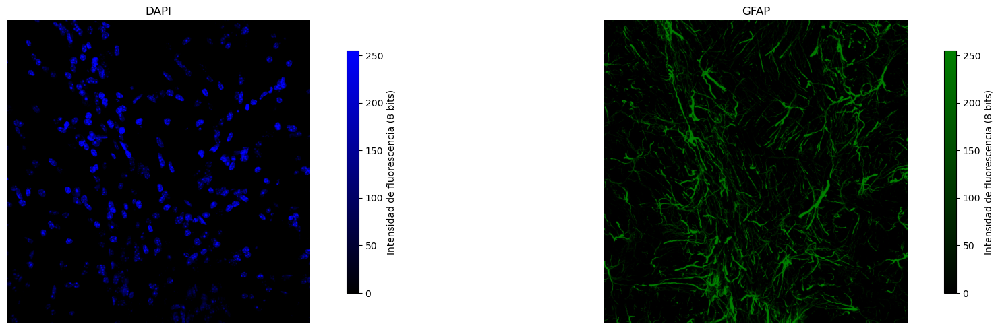

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from aicsimageio import AICSImage
from matplotlib.colors import LinearSegmentedColormap

# Crear colormaps personalizados
black_to_blue = LinearSegmentedColormap.from_list("black_to_blue", ["black", "blue"])
black_to_green = LinearSegmentedColormap.from_list("black_to_green", ["black", "green"])

# Cargar la imagen
filename = "gfap3.tif"
image = AICSImage(filename)

# Obtener los datos en formato numpy array (CZYX para cada canal)
data = image.get_image_data("CZYX", T=0)  # Seleccionamos T=0 si es una imagen 4D
print("Shape de los datos (C, Z, Y, X):", data.shape)

# Convertir la imagen de 16 bits a 8 bits
data_8bit = (data / data.max() * 255).astype(np.uint8)  # Escalar al rango 0-255
print("Imagen convertida a 8 bits")

# Colormaps personalizados para cada canal
channel_colormaps = [
    black_to_blue,  # Black to blue (DAPI)
    black_to_green, # Black to green (GFAP)
]

# Nombres de los canales
channel_names = ["DAPI", "GFAP"]

# Proyección Z y visualización
fig, axes = plt.subplots(1, 2, figsize=(20, 5))
for channel_index, (cmap, name) in enumerate(zip(channel_colormaps, channel_names)):
    # Proyección Z (máximo de intensidad a lo largo del eje Z)
    z_projection = np.max(data_8bit[channel_index], axis=0)
    
    # Mostrar el canal con el colormap personalizado
    im = axes[channel_index].imshow(z_projection, cmap=cmap)
    axes[channel_index].set_title(name)  # Usar el nombre del canal como título
    axes[channel_index].axis("off")
    
    # Agregar barra de color para mostrar el rango de intensidad
    cbar = plt.colorbar(im, ax=axes[channel_index], shrink=0.8)
    cbar.set_label("Intensidad de fluorescencia (8 bits)")

plt.tight_layout()
plt.show()

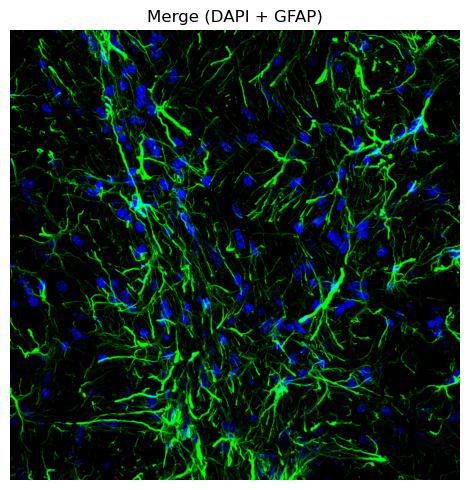

In [3]:
# Crear el merge entre ambos canales
dapi_projection = np.max(data_8bit[0], axis=0)  # Canal DAPI (Azul)
gfap_projection = np.max(data_8bit[1], axis=0)  # Canal GFAP (Verde)

# Crear una imagen RGB combinando ambos canales
rgb_merge = np.zeros((dapi_projection.shape[0], dapi_projection.shape[1], 3), dtype=np.uint8)
rgb_merge[..., 1] = gfap_projection  # GFAP en el canal rojo (verde en RGB)
rgb_merge[..., 2] = dapi_projection  # DAPI en el canal azul

# Visualizar el merge
plt.figure(figsize=(5, 5))
plt.imshow(rgb_merge)
plt.title("Merge (DAPI + GFAP)")
plt.axis("off")
plt.tight_layout()
plt.show()

Diámetro estimado en píxeles: 26.98


C:\Users\Esteban Diaz\anaconda3\envs\bioimaging\lib\site-packages\cellpose\resnet_torch.py:275: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(filenam

Número total de núcleos detectados: 192
Área promedio de los núcleos: 33.29 µm²
Desviación estándar del área: 11.76 µm²


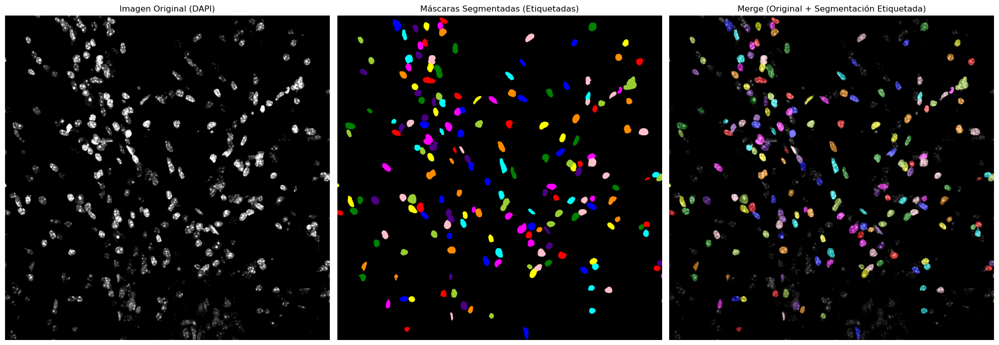

In [4]:
from cellpose import models
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import regionprops_table
from skimage.color import label2rgb
import pandas as pd

# Proyección Z del canal DAPI
dapi_projection = np.max(data_8bit[0], axis=0)  # Canal DAPI (índice 0)

# Tamaño del píxel (en µm) y conversión del diámetro
pixel_size = 0.2965  # µm/píxel
diameter_pixels = 8 / pixel_size
print(f"Diámetro estimado en píxeles: {diameter_pixels:.2f}")

# Crear el modelo de Cellpose
model = models.Cellpose(model_type="nuclei")

# Aplicar la segmentación
masks, flows, styles, diams = model.eval(
    dapi_projection,
    diameter=diameter_pixels,  # Diámetro ajustado en píxeles
    channels=[0, 0]  # Monocromático, sin segundo canal
)

# Calcular estadísticas de los núcleos segmentados
properties = regionprops_table(masks, properties=["label", "area"])
stats = pd.DataFrame(properties)

# Convertir el área de píxeles a micrómetros cuadrados
stats["area_um2"] = stats["area"] * (pixel_size ** 2)

# Estadísticas básicas
num_nuclei = len(stats)
mean_area = stats["area_um2"].mean()
std_area = stats["area_um2"].std()

print(f"Número total de núcleos detectados: {num_nuclei}")
print(f"Área promedio de los núcleos: {mean_area:.2f} µm²")
print(f"Desviación estándar del área: {std_area:.2f} µm²")

# Generar una imagen etiquetada con colores únicos
labeled_image = label2rgb(masks, bg_label=0)

# Visualización
fig, axes = plt.subplots(1, 3, figsize=(20, 10))

# Imagen original
axes[0].imshow(dapi_projection, cmap="gray")
axes[0].set_title("Imagen Original (DAPI)")
axes[0].axis("off")

# Máscaras segmentadas (labeled)
axes[1].imshow(labeled_image)
axes[1].set_title("Máscaras Segmentadas (Etiquetadas)")
axes[1].axis("off")

# Merge (original + máscaras etiquetadas)
axes[2].imshow(dapi_projection, cmap="gray")
axes[2].imshow(labeled_image, alpha=0.5)
axes[2].set_title("Merge (Original + Segmentación Etiquetada)")
axes[2].axis("off")

plt.tight_layout()
plt.show()

In [5]:
import napari

# Crear un visor de Napari
viewer = napari.Viewer()

# Agregar la imagen DAPI y la máscara segmentada
viewer.add_image(dapi_projection, name="DAPI (Proyección Z)", colormap="blue")
viewer.add_labels(masks, name="Máscaras de núcleos (Cellpose)")

# Ejecutar Napari
napari.run()

Assistant skips harvesting pyclesperanto as it's not installed.


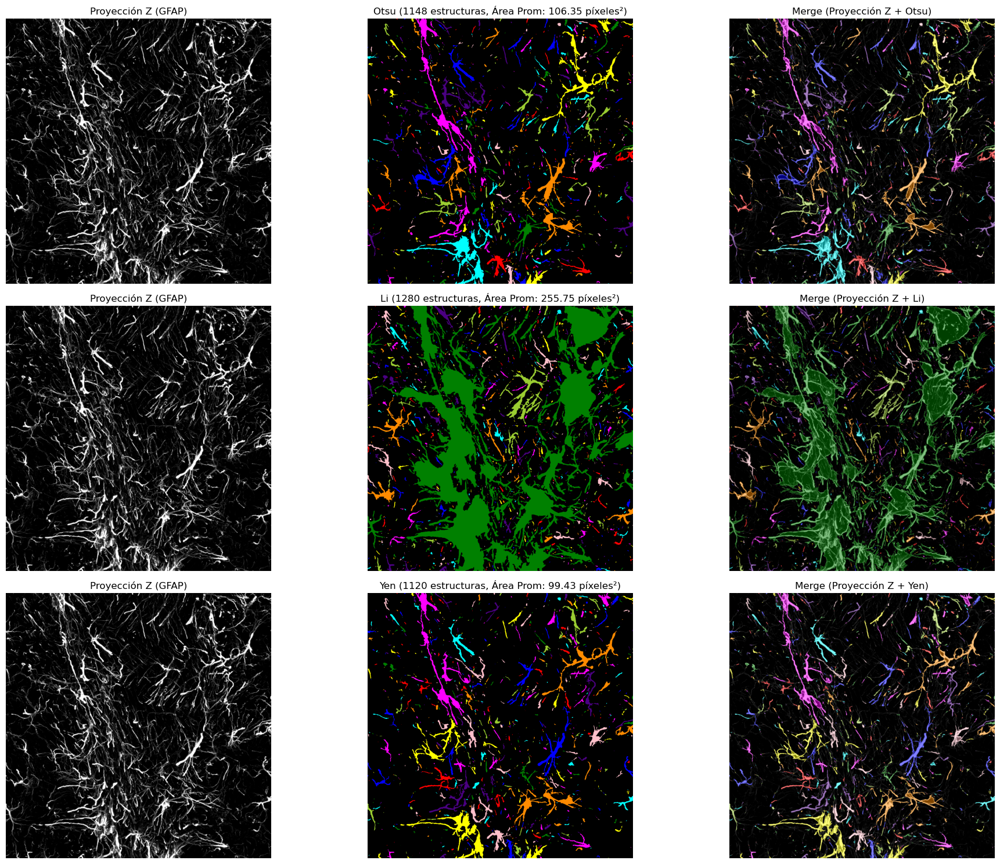

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu, threshold_li, threshold_yen, gaussian
from skimage.measure import label
from skimage.color import label2rgb
from scipy.ndimage import binary_fill_holes

# Proyección Z del canal GFAP
gfap_projection = np.max(data_8bit[1], axis=0)  # Canal GFAP (Proyección Z)

# Filtro Gaussiano para suavizar la proyección
gfap_filtered = gaussian(gfap_projection, sigma=1)

# Métodos de threshold
threshold_methods = {
    "Otsu": threshold_otsu,
    "Li": threshold_li,
    "Yen": threshold_yen
}

segmentations = {}

for method_name, method_func in threshold_methods.items():
    # Aplicar thresholding
    threshold_value = method_func(gfap_filtered)
    binary_mask = gfap_filtered > threshold_value

    # Rellenar huecos
    binary_filled = binary_fill_holes(binary_mask)

    # Etiquetar estructuras
    labeled_image = label(binary_filled)
    segmentations[method_name] = labeled_image

# Visualización de las segmentaciones
fig, axes = plt.subplots(len(segmentations), 3, figsize=(20, 15))

for i, (method_name, labeled_image) in enumerate(segmentations.items()):
    # Generar imágenes etiquetadas
    labeled_colored = label2rgb(labeled_image, bg_label=0)

    # Calcular estadísticas
    num_structures = np.max(labeled_image)
    mean_area = np.sum(labeled_image > 0) / num_structures if num_structures > 0 else 0

    # Imagen original
    axes[i, 0].imshow(gfap_projection, cmap="gray")
    axes[i, 0].set_title("Proyección Z (GFAP)")
    axes[i, 0].axis("off")

    # Segmentación
    axes[i, 1].imshow(labeled_colored)
    axes[i, 1].set_title(f"{method_name} ({num_structures} estructuras, Área Prom: {mean_area:.2f} píxeles²)")
    axes[i, 1].axis("off")

    # Merge
    axes[i, 2].imshow(gfap_projection, cmap="gray")
    axes[i, 2].imshow(labeled_colored, alpha=0.5)
    axes[i, 2].set_title(f"Merge (Proyección Z + {method_name})")
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()

In [7]:
import napari

# Crear un visor de Napari
viewer = napari.Viewer()

# Agregar la proyección Z original
viewer.add_image(gfap_projection, name="Proyección Z (GFAP)", colormap="gray")

# Agregar cada segmentación al visor
for method_name, labeled_image in segmentations.items():
    viewer.add_labels(labeled_image, name=f"Segmentación ({method_name})")

# Ejecutar Napari
napari.run()

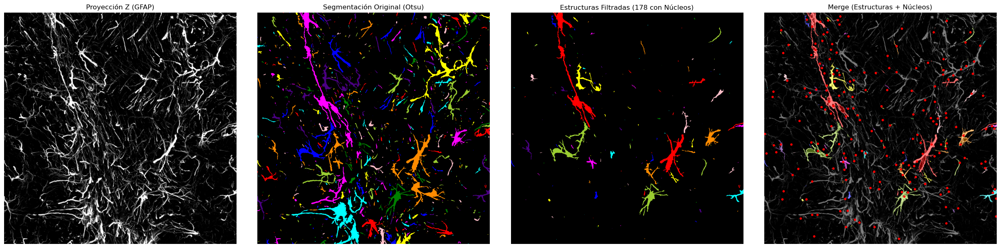

Número total de estructuras detectadas con Otsu: 1148
Número de estructuras con núcleos: 178


In [8]:
from skimage.measure import regionprops_table
import pandas as pd

# Asumimos que `segmentations` tiene las estructuras etiquetadas (como `threshold_yen`, `threshold_otsu`, etc.)
method_to_filter = "Otsu"  # Cambiar según el método deseado
gfap_labels = segmentations[method_to_filter]  # Etiquetas de estructuras GFAP
nucleus_labels = masks  # Segmentación de núcleos DAPI (previamente realizada con Cellpose)

# Obtener centroides de las estructuras GFAP
gfap_props = regionprops_table(gfap_labels, properties=["label", "centroid"])
gfap_df = pd.DataFrame(gfap_props)
gfap_centroids = gfap_df[["centroid-0", "centroid-1"]].to_numpy()

# Obtener centroides de los núcleos
nucleus_props = regionprops_table(nucleus_labels, properties=["label", "centroid"])
nucleus_df = pd.DataFrame(nucleus_props)
nucleus_centroids = nucleus_df[["centroid-0", "centroid-1"]].to_numpy()

# Asociar cada núcleo con la estructura GFAP más cercana
from scipy.spatial import cKDTree
gfap_tree = cKDTree(gfap_centroids)
distances, gfap_indices = gfap_tree.query(nucleus_centroids)

# Filtrar las estructuras GFAP que tienen al menos un núcleo
gfap_with_nuclei = gfap_df.iloc[gfap_indices].label.unique()
filtered_gfap_labels = np.isin(gfap_labels, gfap_with_nuclei) * gfap_labels

# Visualización de las estructuras filtradas
filtered_colored = label2rgb(filtered_gfap_labels, bg_label=0)

# Visualización mejorada
fig, axes = plt.subplots(1, 4, figsize=(25, 6))

# Imagen original de GFAP
axes[0].imshow(gfap_projection, cmap="gray")
axes[0].set_title("Proyección Z (GFAP)")
axes[0].axis("off")

# Estructuras segmentadas
axes[1].imshow(label2rgb(gfap_labels, bg_label=0))
axes[1].set_title(f"Segmentación Original ({method_to_filter})")
axes[1].axis("off")

# Estructuras filtradas
axes[2].imshow(filtered_colored)
axes[2].set_title(f"Estructuras Filtradas ({len(gfap_with_nuclei)} con Núcleos)")
axes[2].axis("off")

# Merge (GFAP + Núcleos)
axes[3].imshow(gfap_projection, cmap="gray")
axes[3].imshow(filtered_colored, alpha=0.5)
axes[3].scatter(
    nucleus_centroids[:, 1],  # Coordenadas Y
    nucleus_centroids[:, 0],  # Coordenadas X
    c="red", label="Núcleos", s=10
)
axes[3].set_title("Merge (Estructuras + Núcleos)")
axes[3].axis("off")

plt.tight_layout()
plt.show()

# Métricas finales
print(f"Número total de estructuras detectadas con {method_to_filter}: {np.max(gfap_labels)}")
print(f"Número de estructuras con núcleos: {len(gfap_with_nuclei)}")

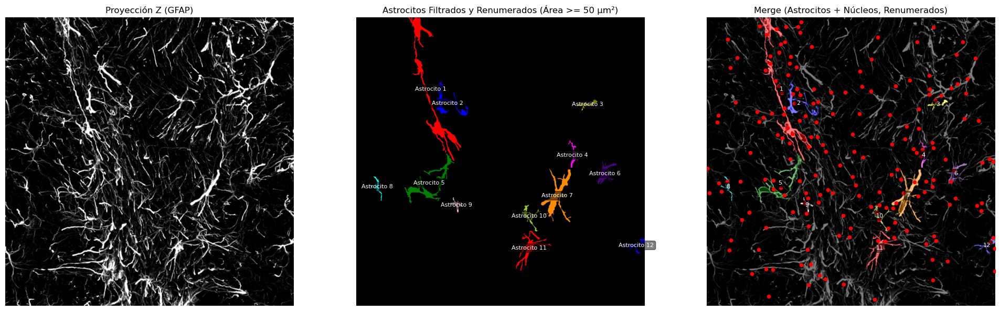

Número total de astrocitos únicos detectados (Área >= 50 µm²): 12


In [9]:
from skimage.measure import regionprops, label
import numpy as np
import matplotlib.pyplot as plt
from skimage.color import label2rgb
from scipy.spatial import cKDTree

# Parámetros
area_threshold = 50  # Umbral de área mínima en µm² para filtrar astrocitos

# Calcular el área de cada estructura en la segmentación filtrada
astrocyte_props = regionprops(filtered_gfap_labels)
astrocyte_areas = [prop.area * (pixel_size ** 2) for prop in astrocyte_props]  # Convertir área a µm²

# Crear un nuevo label eliminando estructuras con área < area_threshold
filtered_astrocyte_labels = np.zeros_like(filtered_gfap_labels)
for idx, prop in enumerate(astrocyte_props):
    if astrocyte_areas[idx] >= area_threshold:
        filtered_astrocyte_labels[tuple(prop.coords.T)] = prop.label

# Reasignar etiquetas consecutivas a los astrocitos
relabel_mapping = {old_label: new_label for new_label, old_label in enumerate(np.unique(filtered_astrocyte_labels)[1:], start=1)}
filtered_astrocyte_labels_relabel = np.zeros_like(filtered_astrocyte_labels)
for old_label, new_label in relabel_mapping.items():
    filtered_astrocyte_labels_relabel[filtered_astrocyte_labels == old_label] = new_label

# Actualizar los centroides con las nuevas etiquetas
new_astrocyte_props = regionprops(filtered_astrocyte_labels_relabel)
new_centroids = {prop.label: prop.centroid for prop in new_astrocyte_props}

# Calcular núcleos asociados a los astrocitos renumerados
gfap_tree = cKDTree(list(new_centroids.values()))
distances, gfap_indices = gfap_tree.query(nucleus_centroids)

# Seleccionar núcleos asociados a los astrocitos renumerados
nuclei_with_gfap = np.array([i for i, idx in enumerate(gfap_indices) if idx + 1 in relabel_mapping.values()])

# Visualización con etiquetas actualizadas
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Imagen original de GFAP
axes[0].imshow(gfap_projection, cmap="gray")
axes[0].set_title("Proyección Z (GFAP)")
axes[0].axis("off")

# Máscaras de astrocitos filtrados y renumerados
labeled_filtered = label2rgb(filtered_astrocyte_labels_relabel, bg_label=0)
axes[1].imshow(labeled_filtered)
axes[1].set_title(f"Astrocitos Filtrados y Renumerados (Área >= {area_threshold} µm²)")

# Agregar etiquetas nuevas
for label, (centroid_y, centroid_x) in new_centroids.items():
    axes[1].text(centroid_x, centroid_y, f"Astrocito {label}",
                 color="white", fontsize=8, ha="center", va="center", bbox=dict(boxstyle="round", facecolor="black", alpha=0.5))
axes[1].axis("off")

# Merge con núcleos aceptados
axes[2].imshow(gfap_projection, cmap="gray")
axes[2].imshow(labeled_filtered, alpha=0.5)
axes[2].scatter(
    nucleus_centroids[nuclei_with_gfap, 1],  # Coordenadas Y
    nucleus_centroids[nuclei_with_gfap, 0],  # Coordenadas X
    c="red", label="Núcleos Aceptados", s=20
)

# Agregar etiquetas nuevas también aquí
for label, (centroid_y, centroid_x) in new_centroids.items():
    axes[2].text(centroid_x, centroid_y, f"{label}", color="white", fontsize=8, ha="center", va="center",
                 bbox=dict(boxstyle="round", facecolor="black", alpha=0.5))

axes[2].set_title(f"Merge (Astrocitos + Núcleos, Renumerados)")
axes[2].axis("off")

plt.tight_layout()
plt.show()

# Número total de astrocitos restantes
num_filtered_astrocytes = len(new_centroids)
print(f"Número total de astrocitos únicos detectados (Área >= {area_threshold} µm²): {num_filtered_astrocytes}")

In [10]:
import napari

# Iniciar el visor de Napari
viewer = napari.Viewer()

# Agregar la proyección Z del canal GFAP
viewer.add_image(gfap_projection, name="Proyección Z (GFAP)", colormap="gray")

# Agregar las etiquetas de astrocitos filtrados y renumerados
viewer.add_labels(filtered_astrocyte_labels_relabel, name="Astrocitos Filtrados y Renumerados")

# Coordenadas y etiquetas para mostrar los números de astrocitos
points_coords = np.array([new_centroids[label] for label in sorted(new_centroids.keys())])  # Coordenadas de los centroides
points_labels = [f"{label}" for label in sorted(new_centroids.keys())]  # Números de los astrocitos

# Agregar los centroides de los astrocitos como puntos y texto
points_layer = viewer.add_points(
    points_coords,
    size=10,
    face_color="yellow",
    edge_color="black",
    name="Centroides de Astrocitos",
)

# Asociar texto a los puntos
points_layer.text = {
    "string": points_labels,
    "size": 8,
    "color": "white",
    "anchor": "center",
    "translation": [-10, 0],  # Ajustar posición del texto
}

# Agregar los núcleos aceptados como puntos
viewer.add_points(
    nucleus_centroids[nuclei_with_gfap],  # Coordenadas (Y, X)
    size=5,
    face_color="red",
    name="Núcleos Aceptados",
)

# Ejecutar Napari
napari.run()

C:\Users\Esteban Diaz\anaconda3\envs\bioimaging\lib\site-packages\napari\utils\migrations.py:101: FutureWarning: Argument 'edge_color' is deprecated, please use 'border_color' instead. The argument 'edge_color' was deprecated in 0.5.0 and it will be removed in 0.6.0.
  return func(*args, **kwargs)


In [11]:
from skimage.measure import regionprops_table
import pandas as pd

# Calcular propiedades de los astrocitos filtrados y renumerados
properties = regionprops_table(
    filtered_astrocyte_labels_relabel,  # Usar las etiquetas renumeradas
    intensity_image=gfap_projection,   # Usamos la proyección Z de GFAP para la intensidad
    properties=[
        "label",         # Identificador único del astrocito (renumerado)
        "area",          # Área en píxeles
        "perimeter",     # Perímetro en píxeles
        "mean_intensity",  # Intensidad media
        "max_intensity",   # Intensidad máxima
        "min_intensity",   # Intensidad mínima
        "centroid",      # Coordenadas del centroide
    ]
)

# Convertir los resultados a un DataFrame para facilitar el análisis
astrocyte_metrics = pd.DataFrame(properties)

# Convertir el área y el perímetro a unidades reales (micrómetros cuadrados y micrómetros)
astrocyte_metrics["area_um2"] = astrocyte_metrics["area"] * (pixel_size**2)
astrocyte_metrics["perimeter_um"] = astrocyte_metrics["perimeter"] * pixel_size

# Mostrar resumen de los datos
print("Resumen de Métricas de Astrocitos Renumerados:")
print(astrocyte_metrics.describe())

# Visualización de las propiedades
print(f"Número total de astrocitos renumerados: {len(astrocyte_metrics)}")
astrocyte_metrics.head()

Resumen de Métricas de Astrocitos Renumerados:
           label         area    perimeter  mean_intensity  max_intensity  \
count  12.000000    12.000000    12.000000       12.000000           12.0   
mean    6.500000  2389.333333   723.930967      163.123534          255.0   
std     3.605551  2405.135465   595.471773       13.268675            0.0   
min     1.000000   584.000000   203.545202      139.428903          255.0   
25%     3.750000   592.750000   279.637085      154.415259          255.0   
50%     6.500000  1434.500000   484.016811      163.412814          255.0   
75%     9.250000  3189.000000  1033.458243      170.897940          255.0   
max    12.000000  8500.000000  2154.488599      187.047736          255.0   

       min_intensity  centroid-0  centroid-1    area_um2  perimeter_um  
count      12.000000   12.000000   12.000000   12.000000     12.000000  
mean       14.750000  560.517138  557.287869  210.051669    214.645532  
std        13.896533  189.723788  292.91

,label,area,perimeter,mean_intensity,max_intensity,min_intensity,centroid-0,centroid-1,area_um2,perimeter_um
0,1,8500,2154.488599,164.471176,255.0,0.0,254.553882,265.060471,747.254125,638.805870
1,2,2425,780.932070,177.814845,255.0,11.0,304.240825,325.091546,213.187206,231.546359
2,3,586,245.551299,170.667235,255.0,38.0,307.771331,820.771331,51.516579,72.805960
3,4,585,283.722871,154.700855,255.0,26.0,488.230769,768.516239,51.428666,84.123831
4,5,4311,1360.916918,139.428903,255.0,0.0,587.542102,259.991417,378.989710,403.511866


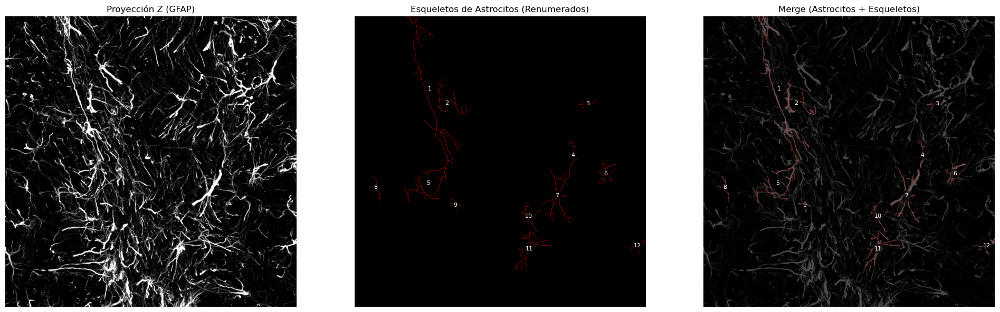

In [12]:
from skimage.morphology import skeletonize
import pandas as pd
import matplotlib.pyplot as plt
from skimage.color import label2rgb

# Esqueletización de cada astrocito individual en las etiquetas renumeradas
skeletonized_astrocytes = skeletonize(filtered_astrocyte_labels_relabel > 0)

# Calcular propiedades morfológicas relacionadas con el esqueleto
astrocyte_skeleton_metrics = []

# Calcular centroides y métricas para las etiquetas renumeradas
astrocyte_props = regionprops(filtered_astrocyte_labels_relabel)
centroid_coords = {}
for label_id in np.unique(filtered_astrocyte_labels_relabel):
    if label_id == 0:  # Ignorar fondo
        continue

    # Extraer el esqueleto para el astrocito actual
    single_astrocyte_mask = (filtered_astrocyte_labels_relabel == label_id)
    single_skeleton = skeletonized_astrocytes * single_astrocyte_mask

    # Calcular métricas del esqueleto
    skeleton_length = np.sum(single_skeleton) * pixel_size  # Longitud total (µm)

    # Agregar métricas al listado
    astrocyte_skeleton_metrics.append({
        "label": label_id,
        "skeleton_length_um": skeleton_length,
    })

    # Guardar el centroide para la visualización
    centroid = regionprops(single_astrocyte_mask.astype(int))[0].centroid
    centroid_coords[label_id] = centroid

# Convertir los resultados a un DataFrame
skeleton_metrics_df = pd.DataFrame(astrocyte_skeleton_metrics)

# Visualización de los esqueletos
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Imagen original GFAP
axes[0].imshow(gfap_projection, cmap="gray")
axes[0].set_title("Proyección Z (GFAP)")
axes[0].axis("off")

# Máscaras de astrocitos esqueletizados
labeled_skeleton = label2rgb(skeletonized_astrocytes, bg_label=0)
axes[1].imshow(labeled_skeleton)
axes[1].set_title("Esqueletos de Astrocitos (Renumerados)")

# Agregar etiquetas de los astrocitos
for label_id, (centroid_y, centroid_x) in centroid_coords.items():
    axes[1].text(
        centroid_x,
        centroid_y,
        f"{label_id}",
        color="white",
        fontsize=8,
        ha="center",
        va="center",
        bbox=dict(boxstyle="round", facecolor="black", alpha=0.5),
    )
axes[1].axis("off")

# Merge (Astrocitos + Esqueletos)
axes[2].imshow(gfap_projection, cmap="gray")
axes[2].imshow(labeled_skeleton, alpha=0.7)
axes[2].set_title("Merge (Astrocitos + Esqueletos)")

# Agregar etiquetas también en el merge
for label_id, (centroid_y, centroid_x) in centroid_coords.items():
    axes[2].text(
        centroid_x,
        centroid_y,
        f"{label_id}",
        color="white",
        fontsize=8,
        ha="center",
        va="center",
        bbox=dict(boxstyle="round", facecolor="black", alpha=0.5),
    )
axes[2].axis("off")

plt.tight_layout()
plt.show()



In [13]:
import napari
import numpy as np

# Crear el visor de Napari
viewer = napari.Viewer()

# Agregar la proyección Z del canal GFAP
viewer.add_image(gfap_projection, name="Proyección Z (GFAP)", colormap="gray")

# Agregar las etiquetas de astrocitos renumeradas
viewer.add_labels(filtered_astrocyte_labels_relabel, name="Astrocitos Filtrados (Renumerados)")

# Agregar el esqueleto
viewer.add_labels(skeletonized_astrocytes, name="Esqueletos de Astrocitos")

# Agregar los centroides como puntos
centroid_points = np.array(list(centroid_coords.values()))  # Coordenadas (Y, X) de los centroides
labels = list(centroid_coords.keys())  # Etiquetas de los astrocitos

# Agregar los puntos al visor
viewer.add_points(
    centroid_points,
    size=10,
    face_color="red",
    edge_color="black",
    name="Centroides",
    properties={"label": labels},
    text={"text": "label", "size": 12, "color": "yellow", "anchor": "center"},
)

# Ejecutar Napari
napari.run()

C:\Users\Esteban Diaz\anaconda3\envs\bioimaging\lib\site-packages\napari\utils\migrations.py:101: FutureWarning: Argument 'edge_color' is deprecated, please use 'border_color' instead. The argument 'edge_color' was deprecated in 0.5.0 and it will be removed in 0.6.0.
  return func(*args, **kwargs)


Métricas avanzadas de astrocitos filtrados (Renumerados):
    label  skeleton_length_um  convex_area_um2  convex_ratio  \
0       1            315.7725      3950.908383      0.189135   
1       2            114.7455       748.177204      0.284942   
2       3             32.6150       119.033187      0.432792   
3       4             41.5100       180.527805      0.284879   
4       5            198.3585      1507.299482      0.251436   
5       6             89.2465       372.000686      0.432471   
6       7            174.0455      1488.310436      0.270829   
7       8             38.2485       154.769516      0.337972   
8       9             29.6500       104.835358      0.489727   
9      10             64.6370       336.264356      0.271634   
10     11            154.4765       854.155421      0.289728   
11     12             42.9925       197.846519      0.363030   

    astrocyte_area_um2  mean_intensity  max_intensity  circularity  \
0           747.254125      164.471176 

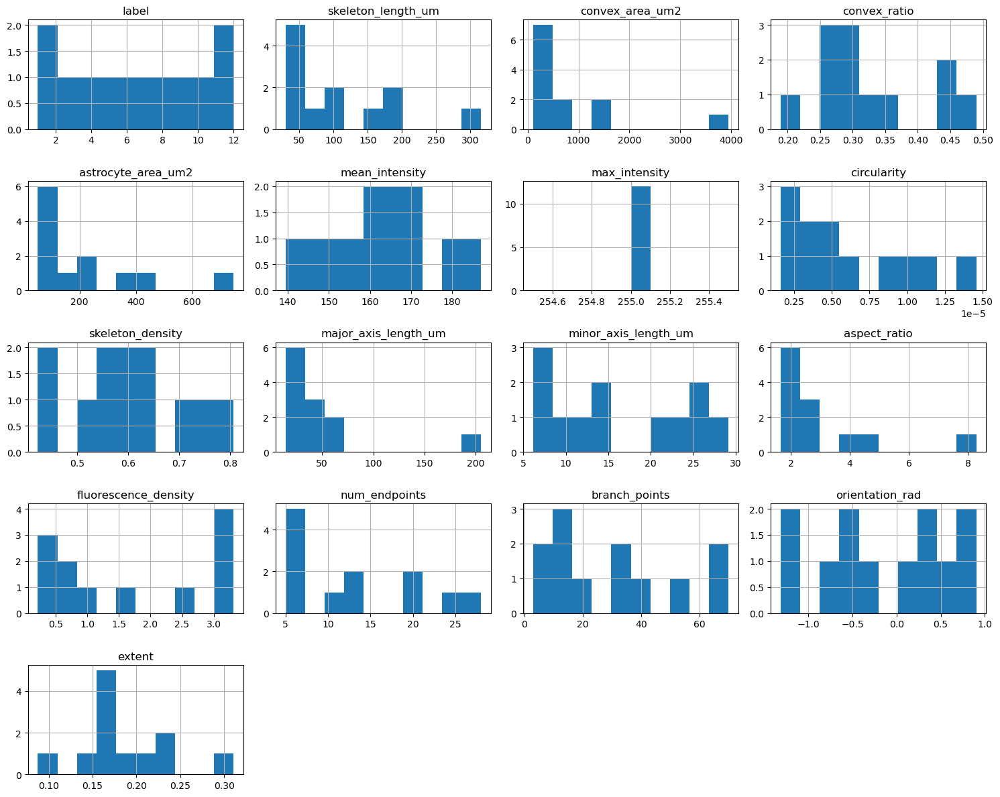

In [14]:
from skimage.morphology import skeletonize
from skimage.measure import regionprops
from scipy.spatial import ConvexHull
import numpy as np
import pandas as pd
from scipy.ndimage import convolve

# Kernel para detectar puntos de ramificación y terminales en el esqueleto
kernel_branch = np.array([[1, 1, 1],
                          [1, 10, 1],
                          [1, 1, 1]])

# Inicializar lista para guardar métricas avanzadas
advanced_metrics = []

for label_id in np.unique(filtered_astrocyte_labels_relabel):
    if label_id == 0:  # Ignorar fondo
        continue

    # Máscara binaria del astrocito actual
    single_astrocyte_mask = (filtered_astrocyte_labels_relabel == label_id)

    # Esqueletización del astrocito
    single_skeleton = skeletonize(single_astrocyte_mask)

    # 1. Longitud total del esqueleto
    skeleton_length = np.sum(single_skeleton) * pixel_size

    # 2. Área del Convex Hull (envolvente convexa)
    coords = np.column_stack(np.nonzero(single_astrocyte_mask))
    if len(coords) > 3:  # Convex Hull necesita al menos 4 puntos
        hull = ConvexHull(coords)
        convex_area = hull.volume * pixel_size ** 2
    else:
        convex_area = np.nan

    # 3. Proporción entre el área del astrocito y el área convexa
    astrocyte_area = np.sum(single_astrocyte_mask) * pixel_size ** 2
    convex_ratio = astrocyte_area / convex_area if convex_area > 0 else np.nan

    # 4. Circularidad
    perimeter = np.sum(skeletonize(single_astrocyte_mask, method='lee')) * pixel_size
    circularity = (4 * np.pi * astrocyte_area) / (perimeter**2) if perimeter > 0 else np.nan

    # 5. Número de puntos terminales y de ramificación
    convolved_skeleton = convolve(single_skeleton.astype(int), kernel_branch, mode="constant", cval=0)
    num_endpoints = np.sum(convolved_skeleton == 11)  # Puntos terminales
    branch_points = np.sum(convolved_skeleton == 13)  # Puntos de ramificación

    # 6. Densidad del esqueleto (longitud total / área del astrocito)
    skeleton_density = skeleton_length / astrocyte_area if astrocyte_area > 0 else np.nan

    # 7. Fluorescencia promedio y densidad de fluorescencia
    mean_intensity = np.mean(gfap_projection[single_astrocyte_mask])
    max_intensity = np.max(gfap_projection[single_astrocyte_mask])
    fluorescence_density = mean_intensity / astrocyte_area if astrocyte_area > 0 else np.nan

    # 8. Propiedades geométricas adicionales
    props = regionprops(single_astrocyte_mask.astype(int))[0]
    major_axis_length = props.major_axis_length * pixel_size
    minor_axis_length = props.minor_axis_length * pixel_size
    aspect_ratio = major_axis_length / minor_axis_length if minor_axis_length > 0 else np.nan
    orientation = props.orientation  # En radianes
    extent = props.extent  # Razón área / bounding box

    # Guardar métricas en la lista
    advanced_metrics.append({
        "label": label_id,
        "skeleton_length_um": skeleton_length,
        "convex_area_um2": convex_area,
        "convex_ratio": convex_ratio,
        "astrocyte_area_um2": astrocyte_area,
        "mean_intensity": mean_intensity,
        "max_intensity": max_intensity,
        "circularity": circularity,
        "skeleton_density": skeleton_density,
        "major_axis_length_um": major_axis_length,
        "minor_axis_length_um": minor_axis_length,
        "aspect_ratio": aspect_ratio,
        "fluorescence_density": fluorescence_density,
        "num_endpoints": num_endpoints,
        "branch_points": branch_points,
        "orientation_rad": orientation,
        "extent": extent,
    })

# Crear un DataFrame con las métricas avanzadas
advanced_metrics_df = pd.DataFrame(advanced_metrics)

# Mostrar las métricas avanzadas
print("Métricas avanzadas de astrocitos filtrados (Renumerados):")
print(advanced_metrics_df)

# Visualización opcional de histogramas para las métricas
advanced_metrics_df.hist(bins=10, figsize=(15, 12))
plt.tight_layout()
plt.show()

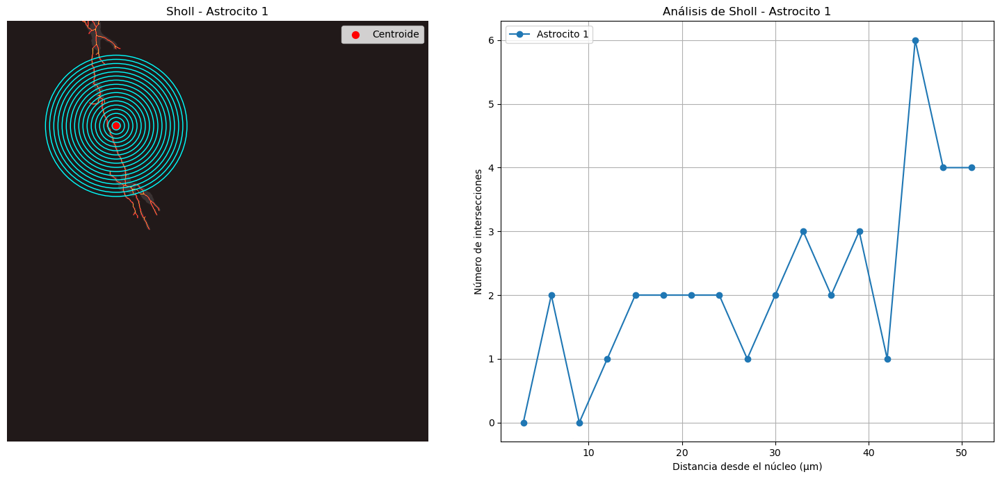

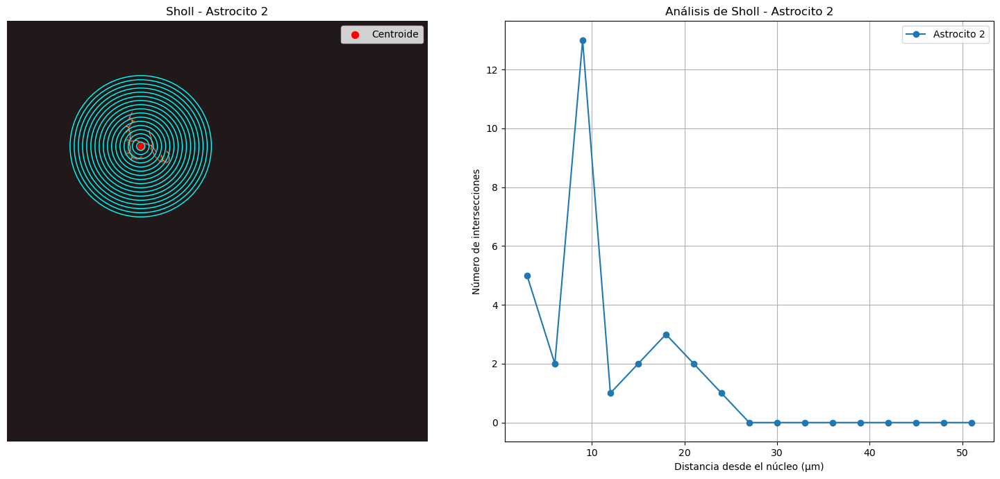

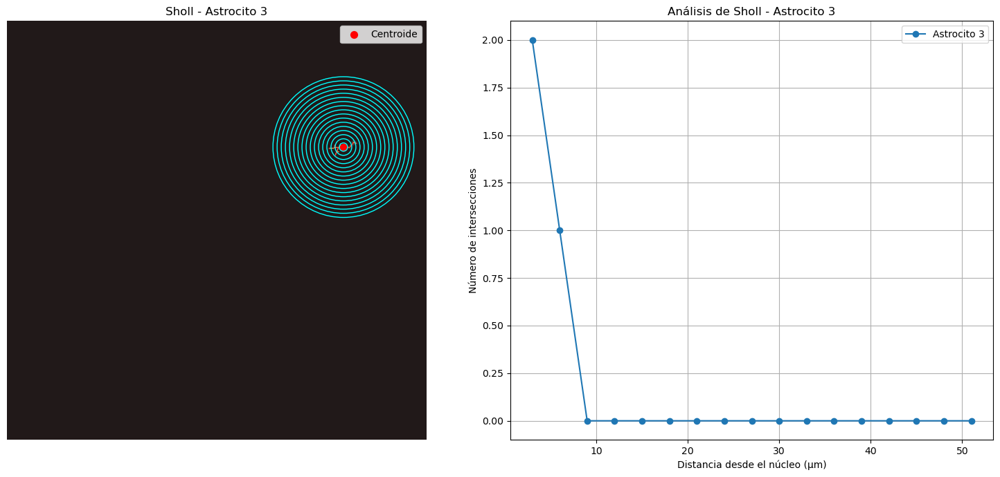

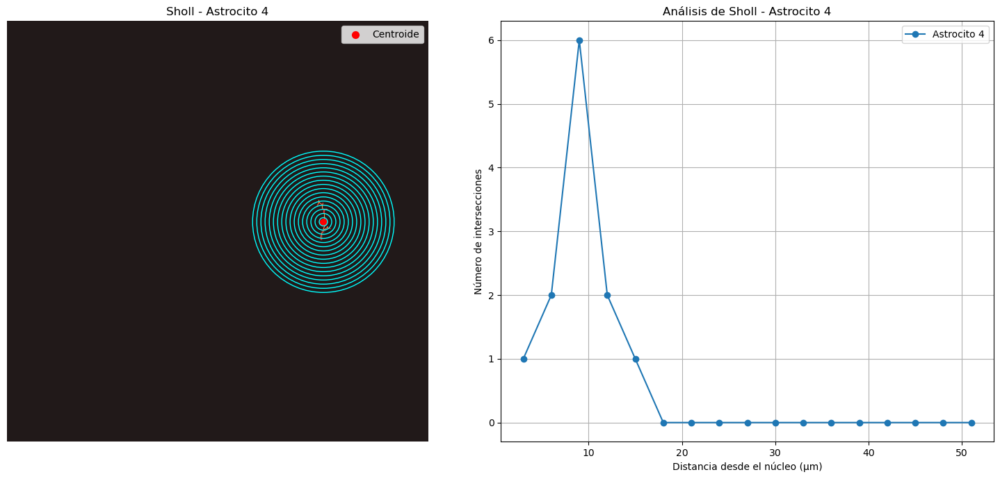

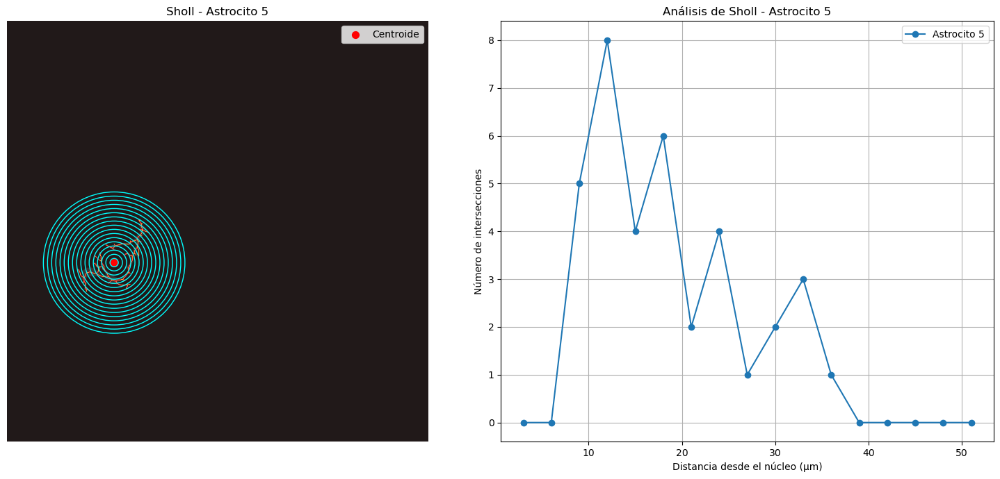

...

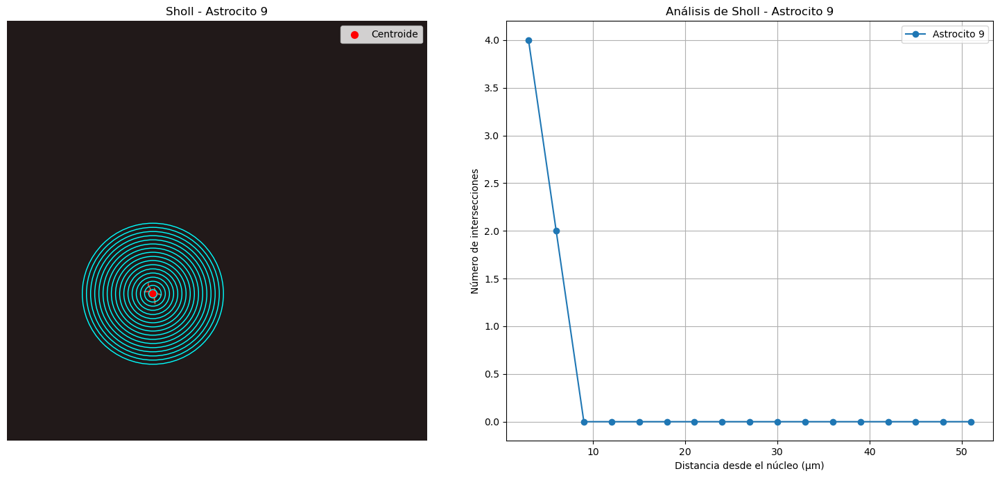

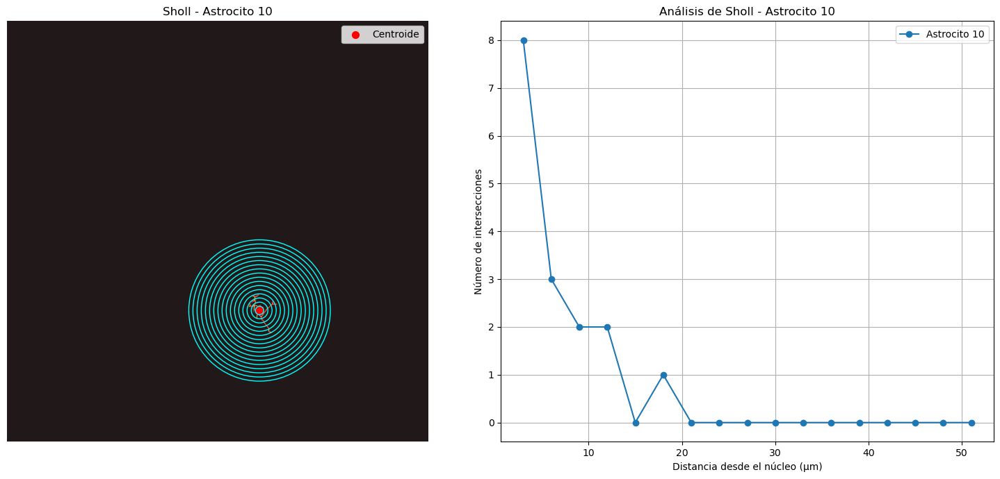

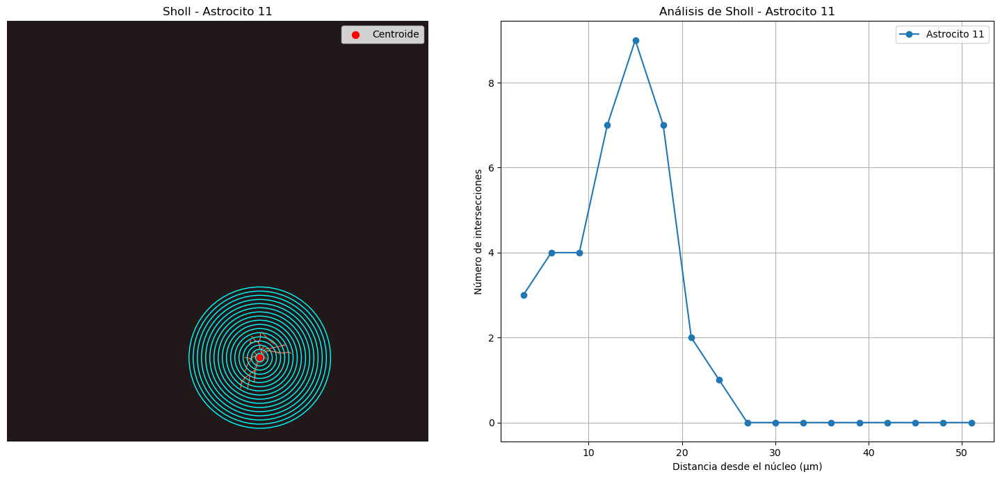

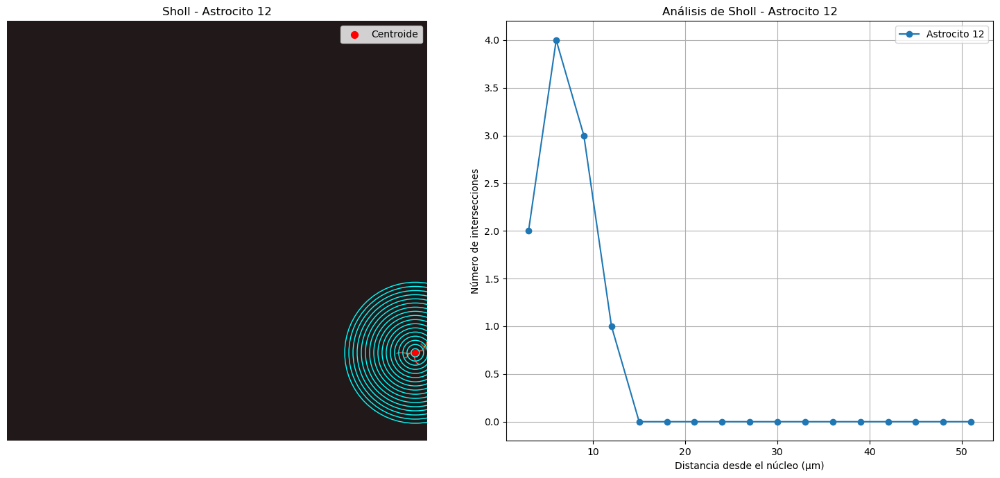

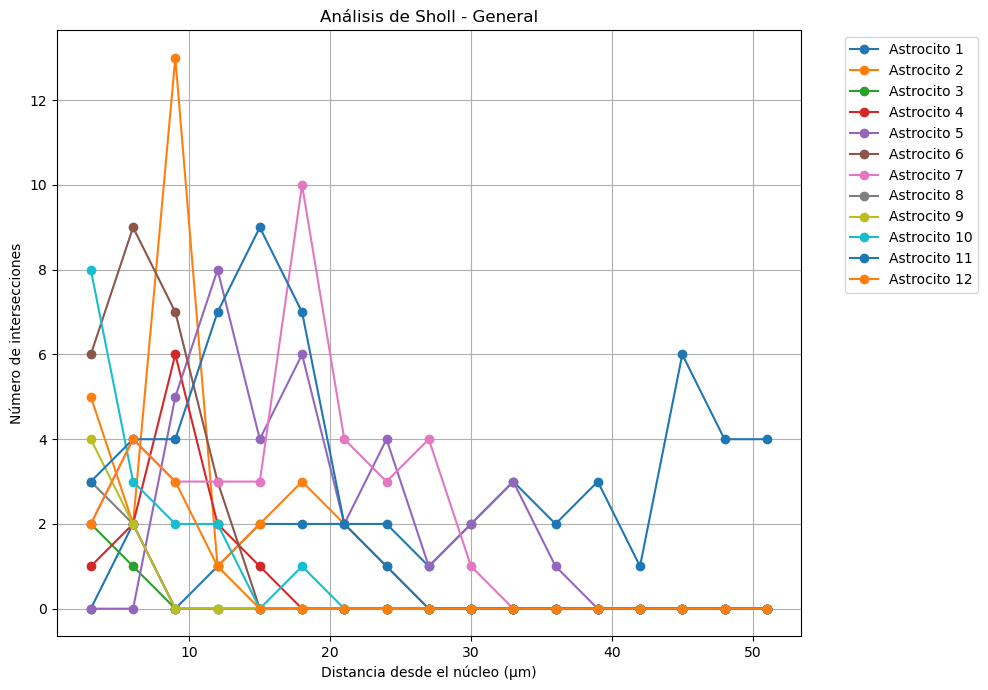

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import skeletonize

# Parámetros de Sholl
ring_spacing = 3  # Espaciado de anillos en µm
max_distance = 50  # Distancia máxima en µm
tolerance = 0.1  # Tolerancia en µm para considerar un punto como intersección

# Inicializar resultados para todas las células
sholl_results_all = {}

# Iterar sobre cada astrocito renumerado
for label_id in np.unique(filtered_astrocyte_labels_relabel):
    if label_id == 0:  # Ignorar fondo
        continue

    # Máscara binaria del astrocito actual
    single_astrocyte_mask = (filtered_astrocyte_labels_relabel == label_id)
    single_skeleton = skeletonize(single_astrocyte_mask)

    # Coordenadas del núcleo (centro del análisis)
    centroid_y, centroid_x = new_centroids[label_id]  # Centroides renumerados

    # Coordenadas del esqueleto
    skel_coords = np.column_stack(np.nonzero(single_skeleton))

    # Calcular distancias desde el núcleo para cada punto del esqueleto
    distances_from_centroid = np.sqrt(
        (skel_coords[:, 0] - centroid_y) ** 2 + (skel_coords[:, 1] - centroid_x) ** 2
    ) * pixel_size

    # Listas para distancias e intersecciones
    distances = np.arange(ring_spacing, max_distance + ring_spacing, ring_spacing)
    intersections = []

    # Contar intersecciones para cada anillo
    for distance in distances:
        # Verificar puntos dentro del rango del anillo
        mask = np.abs(distances_from_centroid - distance) <= tolerance
        num_intersections = np.sum(mask)
        intersections.append(num_intersections)

    # Guardar resultados para este astrocito
    sholl_results_all[label_id] = (distances, intersections)

    # Visualización por astrocito
    fig, axes = plt.subplots(1, 2, figsize=(15, 7))

    # Visualización del esqueleto y los anillos
    axes[0].imshow(single_astrocyte_mask, cmap="gray", alpha=0.5)
    axes[0].imshow(single_skeleton, cmap="hot", alpha=0.8)
    axes[0].scatter(centroid_x, centroid_y, color="red", label="Centroide", s=50)
    axes[0].set_title(f"Sholl - Astrocito {label_id}")
    axes[0].axis("off")

    # Dibujar anillos
    for distance in distances:
        circle = plt.Circle((centroid_x, centroid_y), radius=distance / pixel_size, color="cyan", fill=False, lw=1)
        axes[0].add_patch(circle)

    axes[0].legend()

    # Gráfico de intersecciones
    axes[1].plot(distances, intersections, marker="o", label=f"Astrocito {label_id}")
    axes[1].set_xlabel("Distancia desde el núcleo (µm)")
    axes[1].set_ylabel("Número de intersecciones")
    axes[1].set_title(f"Análisis de Sholl - Astrocito {label_id}")
    axes[1].grid(True)
    axes[1].legend()

    plt.tight_layout()
    plt.show()

# Visualización general combinada
fig, ax = plt.subplots(figsize=(10, 7))
for label_id, (distances, intersections) in sholl_results_all.items():
    ax.plot(distances, intersections, marker="o", label=f"Astrocito {label_id}")

ax.set_xlabel("Distancia desde el núcleo (µm)")
ax.set_ylabel("Número de intersecciones")
ax.set_title("Análisis de Sholl - General")
ax.grid(True)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()